# 2018/2019 - Task List 1

1. Generate random variable from prefered dystribution using Pyro (pyro.sample)
    
    - animate how distribution of values changes
    - animate histograms of values
    - start with empty list of values, generate new samples, generate histogram
    
    
2. Write a simulator (and exact solution utilizing Bayes theorem) for chances to be ill on a certain disease. We know that it affects from about 1 to 100 out of 50,000 people. There was developed a test to check whether the person has the disease and it is quite accurate: the probability that the test result is positive (suggesting the person has the disease), given that the person does not have the disease, is only 2 percent; the probability that the test result is negative (suggesting the person does not have the disease), given that the person has the disease, is only 1 percent. When a random person gets tested for the disease and the result comes back positive, what is the probability that the person has the disease? Check whole parameter space and visualise results.

    - it must be a simulator!
    - sample from distribution using given probabilities
    - repeate experiment and compare with Bayes equation


## Required imports

In [3]:
%matplotlib inline
import pyro
import torch
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML

## Generating single value from normal distribution with given mean and variance

In [4]:
mean = 0
variance = 10
x = pyro.sample("normal_sampling", pyro.distributions.Normal(mean, variance))
print(x)

tensor(-19.9572)


## Sampling from categorical probabilities with given probabilities

In [5]:
x = pyro.sample("categorical_sampling", pyro.distributions.Categorical(logits = torch.tensor([0.5, 0.5])))
print(x)

tensor(1)


## Animating data

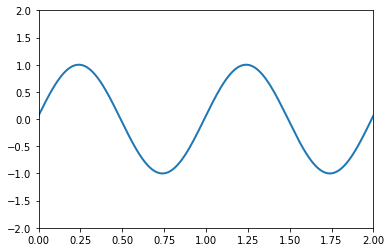

In [18]:
def animate():
    # First set up the figure, the axis, and the plot element we want to animate
    fig, ax = plt.subplots()

    ax.set_xlim(( 0, 2))
    ax.set_ylim((-2, 2))

    line, = ax.plot([], [], lw=2)
    
    # animation function. This is called sequentially
    def sin(i):
        x = np.linspace(0, 2, 1000)
        y = np.sin(2 * np.pi * (x - 0.01 * i))
        line.set_data(x, y)
        return (line,)

    # initialization function: plot the background of each frame
    def init():
        line.set_data([], [])
        return (line,)
    # call the animator. blit=True means only re-draw the parts that have changed.
    anim = animation.FuncAnimation(fig, sin, init_func=init,
                                   frames=100, interval=20, blit=True)
    return HTML(anim.to_jshtml())

animate()

## Drawing histogram

<a list of 30 Patch objects>

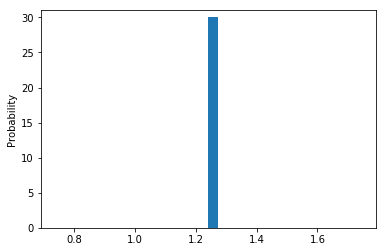

In [28]:
x = np.random.normal(size = 1)
fig, ax = plt.subplots()
ax.set_ylim((0, 31))
r = ax.hist(x, density=True, bins=30)
plt.ylabel('Probability')
r[2]

## Task 1

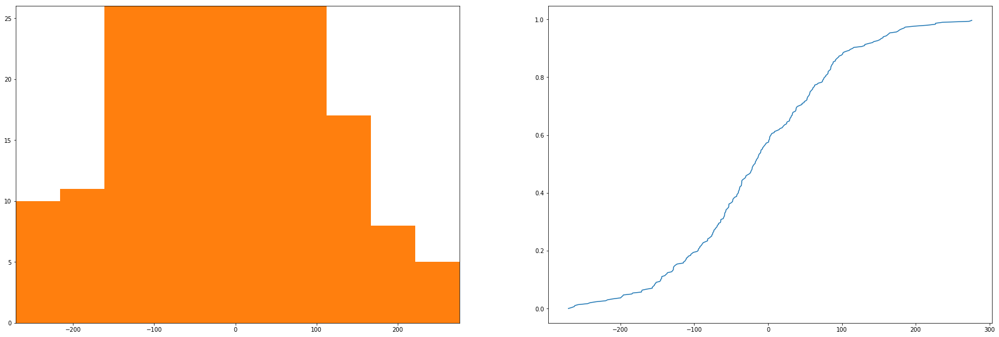

In [81]:
fig, (ax0, ax1) = plt.subplots(1,2, figsize=(30, 10))
sample = []

line, = ax.plot([], [], lw=2)

def gen_val(mean=0, variance=100):
    return pyro.sample("normal_sampling", pyro.distributions.Normal(mean, variance))
    
def histo(ax, i):
    if i == 0:
        return ax.hist(sample)
    ax.clear()
    h = ax.hist(sample, bins=30)
    n, bins, patches = h
    ax.set_ylim((0, max(n)+1))
    ax.set_xlim((min(bins), max(bins)))


ax1.set_ylim((0, 1))
             
def density(ax, i):
    if i > 0:
        ax.clear()
        X2 = np.sort(sample)
        F2 = np.array(range(i))/float(i)
        ax.plot(X2, F2)

def runner(i):
    if i != 0:
        x = gen_val()
        sample.append(x)
    return histo(ax0, i), density(ax1, i)
    

ani = animation.FuncAnimation(fig, runner, frames=300, interval=50)
HTML(ani.to_jshtml())

## Task 2